<h1 style='color:darkblue; text-align:center;font-size:50px'>Projet 7</h1>
<h1 style='color:darkblue; text-align:center'>Implémentez un modèle de scoring</h1>

---

## Importation des données.

In [409]:
# HOME CREDIT DEFAULT RISK COMPETITION
# Most features are created by applying min, max, mean, sum and var functions to grouped tables. 
# Little feature selection is done and overfitting might be a problem since many features are related.
# The following key ideas were used:
# - Divide or subtract important features to get rates (like annuity and income)
# - In Bureau Data: create specific features for Active credits and Closed credits
# - In Previous Applications: create specific features for Approved and Refused applications
# - Modularity: one function for each table (except bureau_balance and application_test)
# - One-hot encoding for categorical features
# All tables are joined with the application DF using the SK_ID_CURR key (except bureau_balance).
# You can use LightGBM with KFold or Stratified KFold.

# Update 16/06/2018:
# - Added Payment Rate feature
# - Removed index from features
# - Use standard KFold CV (not stratified)
import re
import numpy as np
import pandas as pd
import gc
import time
from contextlib import contextmanager
from lightgbm import LGBMClassifier

from sklearn.metrics import roc_auc_score, roc_curve, f1_score
from sklearn.model_selection import KFold, StratifiedKFold
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

@contextmanager
def timer(title):
    t0 = time.time()
    yield
    print("{} - done in {:.0f}s".format(title, time.time() - t0))

# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = df.append(test_df).reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg
    
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

# Combinaison des données

In [410]:
num_rows= None
df = application_train_test(num_rows)
with timer("Process bureau and bureau_balance"):
    bureau = bureau_and_balance(num_rows)
    print("Bureau df shape:", bureau.shape)
    df = df.join(bureau, how='left', on='SK_ID_CURR')
    del bureau
    gc.collect()
with timer("Process previous_applications"):
    prev = previous_applications(num_rows)
    print("Previous applications df shape:", prev.shape)
    df = df.join(prev, how='left', on='SK_ID_CURR')
    del prev
    gc.collect()
with timer("Process POS-CASH balance"):
    pos = pos_cash(num_rows)
    print("Pos-cash balance df shape:", pos.shape)
    df = df.join(pos, how='left', on='SK_ID_CURR')
    del pos
    gc.collect()
with timer("Process installments payments"):
    ins = installments_payments(num_rows)
    print("Installments payments df shape:", ins.shape)
    df = df.join(ins, how='left', on='SK_ID_CURR')
    del ins
    gc.collect()
with timer("Process credit card balance"):
    cc = credit_card_balance(num_rows)
    print("Credit card balance df shape:", cc.shape)
    df = df.join(cc, how='left', on='SK_ID_CURR')
    del cc
    gc.collect()

Train samples: 307511, test samples: 48744
Bureau df shape: (305811, 116)
Process bureau and bureau_balance - done in 18s
Previous applications df shape: (338857, 249)
Process previous_applications - done in 19s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - done in 10s
Installments payments df shape: (339587, 26)
Process installments payments - done in 28s
Credit card balance df shape: (103558, 141)
Process credit card balance - done in 14s


# Nettoyage des données

In [411]:
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', df.shape[1])

In [412]:
# Function to plot the percentage of missing values in a dataframe.
def nan_plot(percentages):
    '''This function plots percentages of missing data.'''
    fig =px.bar(percentages,
                labels={
                    "index":"Columns",
                    "value":"Percentage missing data"
                },
                hover_name=dict(percentages),
                color=percentages.index
               )
    fig.show()
    
# Function to get the percentage of missing values per column of a dataframe.
def percentage_nan(data):
    """This function returns the percentage missing data per column in a dataframe."""
    return round(100*data.isna().sum()/(data.isna().sum()+data.count()),2)

# Function to get the number of missing values per column of a dataframe.
def nan(data):
    """This function returns the number missing data per column in a dataframe."""
    return data.isna().sum()

Shape after removing columns with 60% NaN :  (356251, 585)
Shape after removing columns with null variance:  (356251, 567)


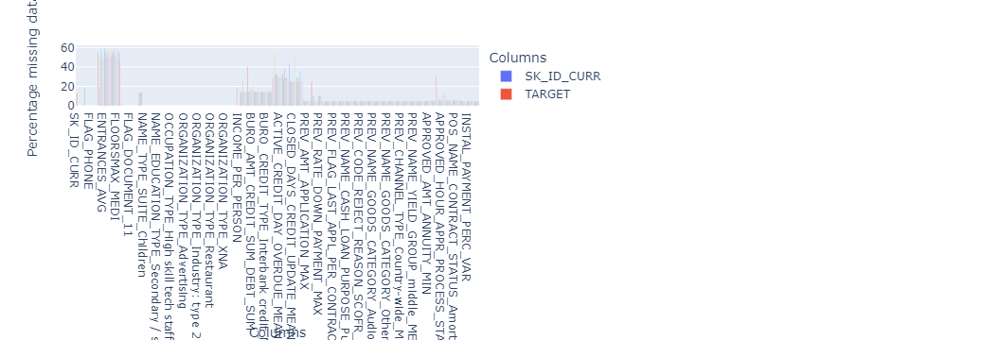

In [413]:
if 'index' in df.columns:
    df = df.drop(columns='index')

# Deletion of columns with 60% and more missing values.
df = df.loc[:,percentage_nan(df) < 60]
print("Shape after removing columns with 60% NaN : ", df.shape)

# Deleting columns with variance == 0.
df = df.loc[:,(df.var() != 0)]
print("Shape after removing columns with null variance: ", df.shape)

# Visualising the percentage of missing values per column.
nan_plot(percentage_nan(df))

## Traitement des valeurs infinies et manquantes

In [414]:
# Replace infinity with NaN.
df = df.replace(to_replace=[np.inf, -np.inf],value=np.NaN)

# Filling NaN in columns with float dtypes.
for col in df.select_dtypes(include=float):
    if col != 'TARGET':
        # Dealing with NaN.
        Q1 = df.loc[:,col].quantile(0.25)
        Q3 = df.loc[:,col].quantile(0.75)
        IQR = Q3-Q1
        Max_not_outliers = Q3 + 1.5*IQR
        Min_not_outliers = Q1 -1.5*IQR

        if df.loc[:,col].max() > Max_not_outliers or df.loc[:,col].min() < Min_not_outliers:
            # Imputation with median.
            df.loc[:,col] = df.loc[:,col].fillna(df.loc[:,col].quantile(0.5))
        elif df.loc[:,col].max() <= Max_not_outliers and df.loc[:,col].min() >= Min_not_outliers:
            # Imputation with mean.
            df.loc[:,col] = df.loc[:,col].fillna(df.loc[:,col].mean())

In [415]:
# Total number of NaN left:
df.isna().sum().sum()

48744

# Analyse de corrélation linéaire de Pearson

In [416]:
correlated_features = set()
correlation_matrix = df.corr()

with timer("Process search of positively correlated variables:"):
    for i in range(len(correlation_matrix .columns)):
        for j in range(i):
            if (correlation_matrix.iloc[i, j]) > 0.7:
                colname = correlation_matrix.columns[i]
                correlated_features.add(colname)

Process search of positively correlated variables: - done in 2s


In [417]:
print("Number of correlated variables :",len(correlated_features))

Number of correlated variables : 158


Regardons si la cible "TARGET" est présente dans __correlated_features__ afin de la retirer.

In [418]:
"TARGET" in correlated_features

False

La cible n'est donc pas dans la liste des variables corrélées. Nous pouvons procéder à la suppression de tous les éléments de cette liste de notre dataset.

In [419]:
df = df.drop(columns=list(correlated_features))
print("Shape of df after deleting correlated variables : {}".format(df.shape))

Shape of df after deleting correlated variables : (356251, 409)


# Séparation des données

In [420]:
# Checking whether the clients ID are unique.
df.SK_ID_CURR.duplicated().sum()

0

In [421]:
# Function to split and remove useless columns from dataset.
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

def prepare_data(df, cols_to_drop, print_shapes=False, standard_scale=True):
    # Deleting columns:
    if cols_to_drop !=None:
        df = df.drop(columns=cols_to_drop)

    # Seperating the data:
    dTest = df.loc[df.TARGET.isna(),:].drop(columns=["TARGET"])
    dTrain = df.loc[df.TARGET.notna(),:]
    dTrain_X = dTrain.drop(columns="TARGET")
    dTrain_y = dTrain.TARGET
    if print_shapes:
        print(f"Shape of dTest = {dTest.shape}")
        print(f"Shape of dTrain = {dTrain.shape}")
        print(f"Shape of dTrain_X = {dTrain_X.shape}")
        print(f"Shape of dTrain_y = {dTrain_y.shape}")
        print("-"*70)
        
    if standard_scale:
        # Standard scaling.
        std = StandardScaler()
        dTrain_Xstd = std.fit_transform(dTrain_X)

        # Seperating data into train and test for the part for whiche TARGET is known.
        Xtrain, Xtest, ytrain, ytest =  train_test_split(dTrain_Xstd, dTrain_y, test_size=0.2, stratify=dTrain_y)
    else:
        # Seperating data into train and test for the part for whiche TARGET is known.
        Xtrain, Xtest, ytrain, ytest =  train_test_split(dTrain_X, dTrain_y, test_size=0.2, stratify=dTrain_y)
    
    if print_shapes:
        print(f"Shape of Xtrain : {Xtrain.shape}")
        print(f"Shape of ytrain : {ytrain.shape}")
    
    return dTest, dTrain, dTrain_X, dTrain_y, Xtrain, Xtest, ytrain, ytest

In [422]:
# Running the function to save the processed data for dashboard including SK_ID_CURR.
dTest, dTrain, dTrain_X, dTrain_y, Xtrain, Xtest, ytrain, ytest = prepare_data(df,cols_to_drop=None)
dTest.to_csv("processed_test_data.csv")
dTrain.to_csv("processed_train_data.csv")

Puisque les identifiants des clients sont unique, la colonne "SK_ID_CURR" peut être supprimée.

In [423]:
# Separating the data using the prepare_data function.
dTest, dTrain, dTrain_X, dTrain_y, Xtrain, Xtest, ytrain, ytest = prepare_data(df,cols_to_drop=["SK_ID_CURR"])


# Tests sur des modèles sans tenir compte que les données ne sont pas équilibrées

In [424]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, auc, roc_curve

def plot_roc(ytest, ypred_lr, pos_label=1, title=None):
    "Plot ROC curve."
    fpr, tpr, thresholds = roc_curve(ytest, ypred_lr, pos_label=pos_label)
    sns.lineplot(x=tpr, y=fpr)
    plt.text(0,0.8,s=f"AUC={round(auc(fpr,tpr),2)}")
    
    
from sklearn.metrics import confusion_matrix
def plot_confusion_matrix(ytrue, ypred, save=False, title=None):
    """This function plots the confusion matrix."""
    confmat = sns.heatmap(confusion_matrix(ytrue, ypred),annot=True, # Write the numbers.
                          fmt='g', # Turn off scientific notations.
                          cbar=False
                         )
    confmat.set_xlabel("Predictions",fontsize=15)
    confmat.set_ylabel("Actual", fontsize=15)
    confmat.set_title("Confusion Matrix", fontsize=17)
    confmat.xaxis.tick_top()
    confmat.xaxis.set_label_position('top')
    plt.show()
    if save:
        confmat.savefig(title)
    
def get_estimator_name(name):
    "Return the name of an estimator as string."
    return f"name={name}".split('=')[1].split('(')[0]

def plot_line(x,y):
    sns.lineplot(data=dtab, x=x, y=y)
    plt.xticks(rotation='90')
    plt.show()

In [425]:
def run_classifiers(Xtrain, Xtest, ytrain, ytest, estimators):

    tab = []
    for estimator in estimators:
        with timer("Process "  + get_estimator_name(estimator)):
            clf = estimator
            clf.fit(Xtrain, ytrain)
            ypred = clf.predict(Xtest)
            yproba = clf.predict_proba(Xtest)
            yscore = yproba[:,1]
        fpr, tpr, thr = roc_curve(ytest, yscore, pos_label=1)
        tab.append([get_estimator_name(estimator),
                    f1_score(ytest, ypred, pos_label=0), f1_score(ytest, ypred, pos_label=1),
                    fpr, tpr, thr, 
                    ypred, yscore
                   ])
    dtab = pd.DataFrame(tab, columns=["estimators","f1score_0", "f1score_1", "fpr", "tpr","thr", "ypred","yscore"])
    
    # Plot F1 scores for comparison
    length_img = len(estimators)+1
    
    with timer("Process Plots"):
        fig, ax = plt.subplots(1,2, figsize=(18,length_img))
        fig.suptitle("Comparing f1 scores")
        sns.barplot(data=dtab, x="estimators", y="f1score_0", ax=ax[0])
        ax[0].set_title("F1 scores for label 0")
        #max_f0 = (max(dtab.loc[:,"f1score_0"])-max(dtab.loc[:,"f1score_0"]))/2.0 # Mid range of f1score
        for i in range(len(dtab)):
            ax[0].text(i, y=dtab.loc[i,"f1score_0"], s=round(dtab.loc[i,"f1score_0"],2))
            
        sns.barplot(data=dtab, x="estimators", y="f1score_1", ax=ax[1])
        ax[1].set_title("F1 scores for label 1")
        #max_f1 = (max(dtab.loc[:,"f1score_1"])-max(dtab.loc[:,"f1score_1"]))/2.0 # Mid range of f1score
        for i in range(len(dtab)):
            ax[1].text(i, y=dtab.loc[i,"f1score_1"], s=round(dtab.loc[i,"f1score_1"],2))

        # Plot ROC curves.
        fig, ax = plt.subplots(1,len(estimators), figsize=(18,length_img))
        for i, estimator in enumerate(estimators):
            sns.lineplot(x=dtab.loc[i,"fpr"], y=dtab.loc[i,"tpr"], ax=ax[i])
            ax[i].set_title("ROC Curve for " + get_estimator_name(estimator))
            
            auc = round(roc_auc_score(ytest, dtab.loc[i,'yscore']), 2) # average='weighted' --> to be added ???
            ax[i].text(0,0.8,s=f"AUC={auc}")
            ax[i].set_ylabel('True Positive Rate')
            ax[i].set_xlabel('False Positive Rate')

        # Confusion matrix for each estimator
        fig, ax = plt.subplots(1,len(estimators),figsize=(18,length_img))
        for i, estimator in enumerate(estimators):
            sns.heatmap(confusion_matrix(ytest, dtab.loc[i,"ypred"]),annot=True, # Write the numbers.
                        fmt='g', # Turn off scientific notations. 
                        cbar=False,
                        ax=ax[i]
                       )
            ax[i].set_xlabel("Predictions",fontsize=15)
            ax[i].set_ylabel("Actual", fontsize=15)
            ax[i].set_title(get_estimator_name(estimator), fontsize=17)
            ax[i].xaxis.tick_top()
            ax[i].xaxis.set_label_position('top');


In [18]:
# List of estimators to test.
estimators = [LogisticRegression(max_iter=2000),
              RandomForestClassifier(n_estimators=100),
              XGBClassifier(),
              LGBMClassifier()
             ]

Process LogisticRegression - done in 24s
Process RandomForestClassifier - done in 237s
Process XGBClassifier - done in 91s
Process LGBMClassifier - done in 11s
Process Plots - done in 236s


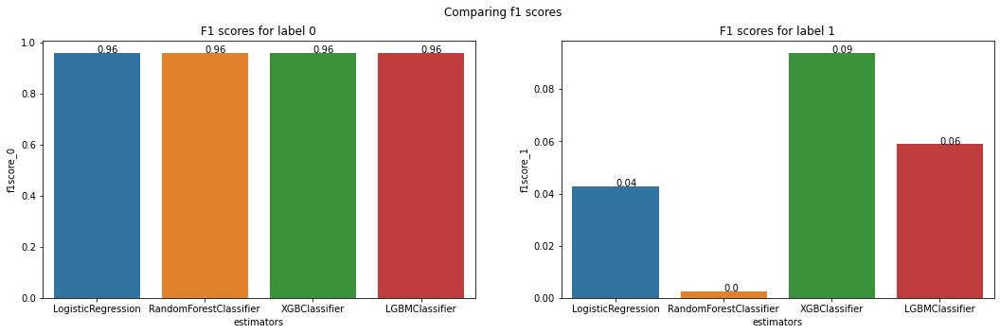

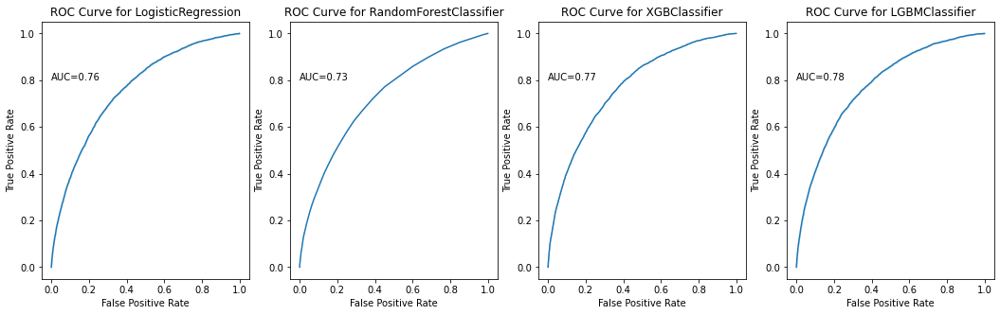

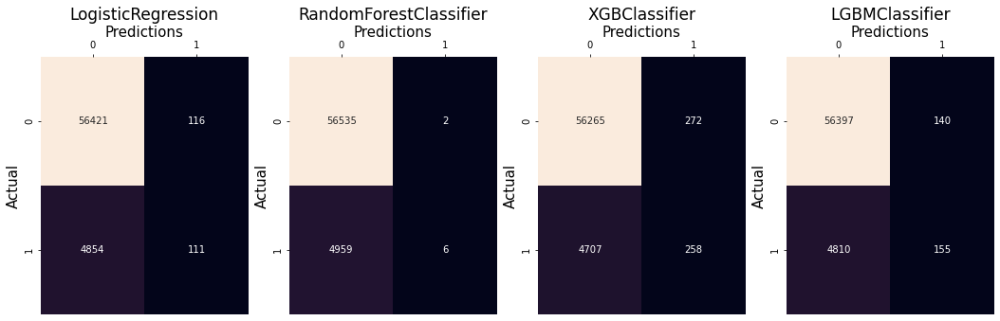

In [19]:
# Running the function for the list of estimators.
dtab = run_classifiers(Xtrain, Xtest, ytrain, ytest, estimators)

# Prise en compte du fait que les données sont déséquilibrées
## Undersampling

In [20]:
from imblearn.under_sampling import RandomUnderSampler 
rus = RandomUnderSampler(random_state=7)
Xrus, yrus = rus.fit_resample(Xtrain, ytrain)
print(f"Shape of Xrus : {Xrus.shape}")
print(f"Shape of yrus : {yrus.shape}")

Shape of Xrus : (39720, 407)
Shape of yrus : (39720,)


Process LogisticRegression - done in 2s
Process RandomForestClassifier - done in 26s
Process XGBClassifier - done in 20s
Process LGBMClassifier - done in 3s
Process Plots - done in 223s


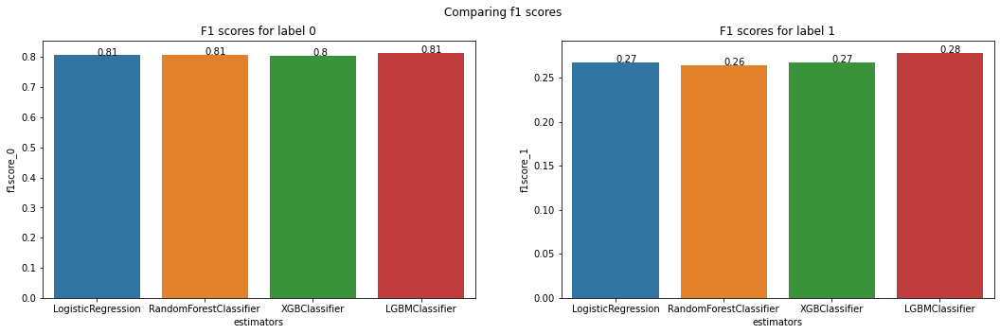

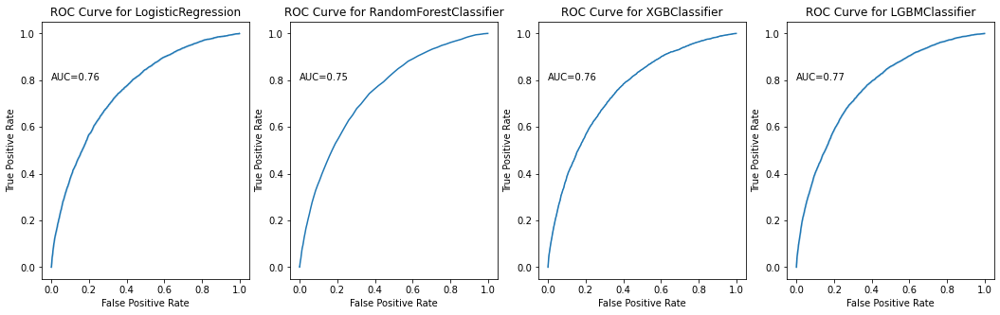

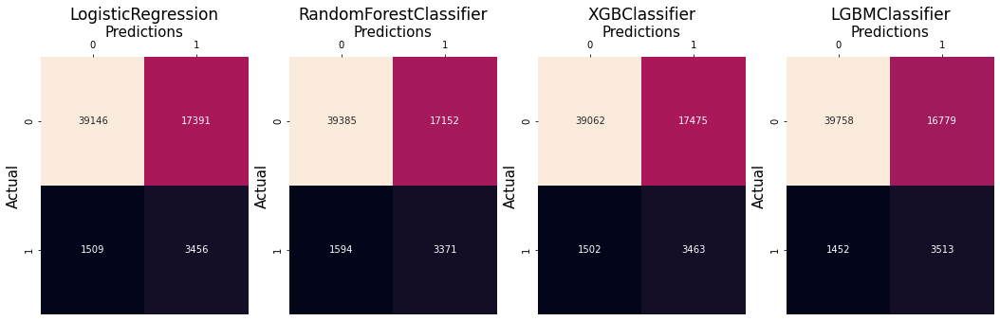

In [21]:
dtab_rus = run_classifiers(Xrus, Xtest, yrus, ytest, estimators)

## Oversampling

In [22]:
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state=7)
Xov, yov = sm.fit_resample(Xtrain, ytrain)
print(f"Shape of Xov : {Xov.shape}")
print(f"Shape of yov : {yov.shape}")

Shape of Xrus : (39720, 407)
Shape of yrus : (39720,)


Process LogisticRegression - done in 47s
Process RandomForestClassifier - done in 502s
Process XGBClassifier - done in 337s
Process LGBMClassifier - done in 23s
Process Plots - done in 226s


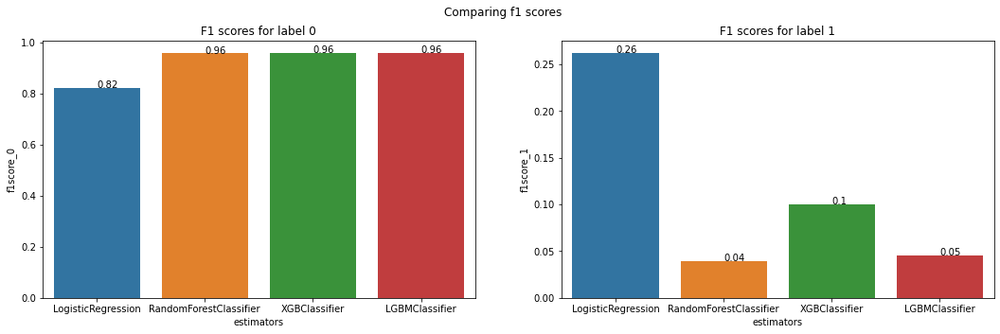

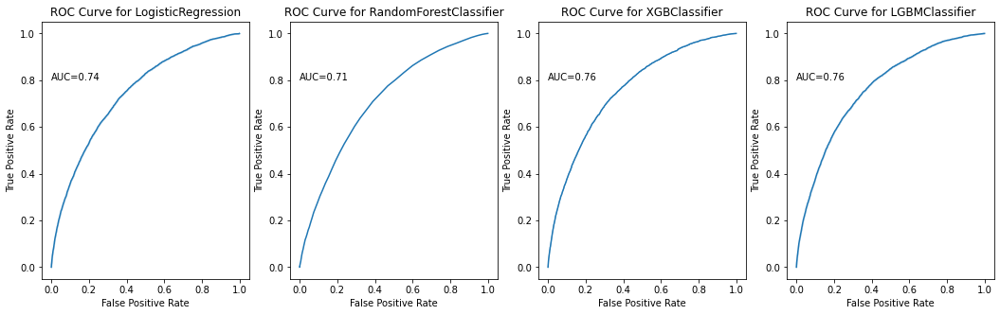

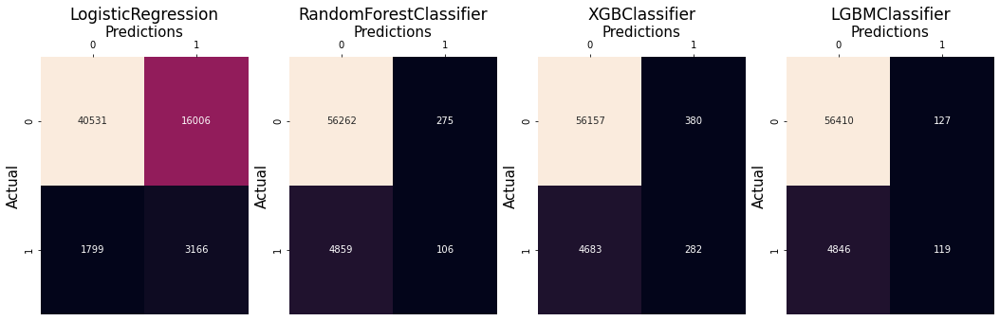

In [23]:
dtab_over = run_classifiers(Xov, Xtest, yov, ytest, estimators)

## Class Weight

In [24]:
from sklearn.utils.class_weight import compute_class_weight

# Calculating class weight : this will be use mainly for XGBClassifier.
a, b = compute_class_weight(class_weight='balanced',classes=np.unique(dTrain_y), y=dTrain_y)

Process LogisticRegression - done in 33s
Process RandomForestClassifier - done in 186s
Process XGBClassifier - done in 126s
Process LGBMClassifier - done in 15s
Process Plots - done in 250s


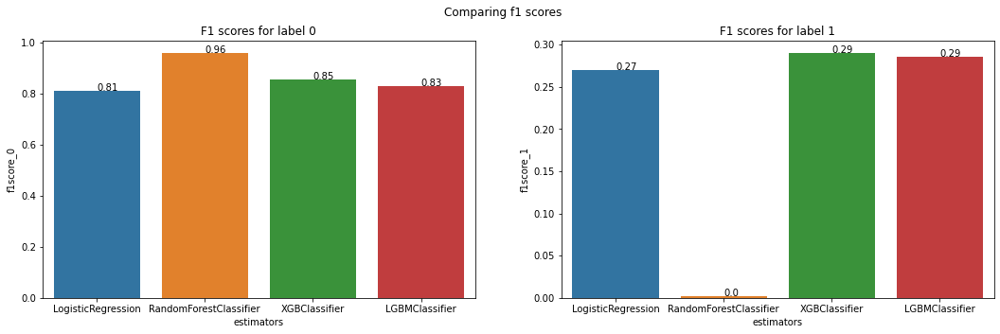

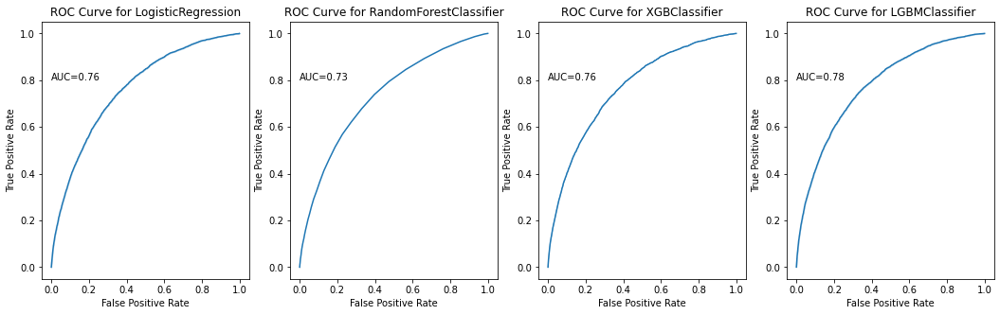

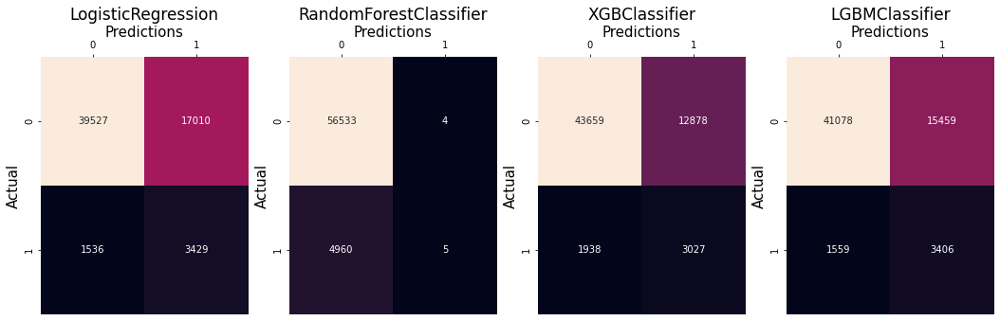

In [25]:
# List of estimators to test.
estimators_cw = [
    LogisticRegression(max_iter=2000,class_weight='balanced'),
    RandomForestClassifier(n_estimators=100, class_weight='balanced'),
    XGBClassifier(scale_pos_weight=b/a),
    LGBMClassifier(class_weight='balanced')
]
# Getting results for each estimator.
dtab_over = run_classifiers(Xtrain, Xtest, ytrain, ytest, estimators_cw)

# Optimisation des paramètres de LightGBM

In [26]:
from sklearn.model_selection import StratifiedKFold, cross_val_score, cross_validate
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
# Separating the data using the prepare_data function.
dTest, dTrain, dTrain_X, dTrain_y, Xtrain, Xtest, ytrain, ytest = prepare_data(df,cols_to_drop=["SK_ID_CURR"])


model = LGBMClassifier(class_weight='balanced')
param_grid = {
    'n_estimators': [400, 700, 1000],
    #'colsample_bytree': [0.7, 0.8],
    #'max_depth': [15,20,25],
    'num_leaves': [31,50, 100, 200],
    #'reg_alpha': [1.1, 1.2, 1.3],
    #'reg_lambda': [1.1, 1.2, 1.3],
    #'min_split_gain': [0.0,0.3, 0.4],
    #'subsample': [0.7, 0.8, 0.9],
    #'subsample_freq': [0,20],
}
# Specifying the type of cross validation for the Random Search CV.
cv =StratifiedKFold(n_splits=5, shuffle=True, random_state=7)

# Grid Search CV
rs = RandomizedSearchCV(estimator=model,param_distributions=param_grid, cv=cv,n_jobs=-1, scoring='roc_auc', verbose=10)
rs.fit(Xtrain,ytrain)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=7, shuffle=True),
                   estimator=LGBMClassifier(class_weight='balanced'), n_jobs=-1,
                   param_distributions={'n_estimators': [400, 700, 1000],
                                        'num_leaves': [31, 50, 100, 200]},
                   scoring='roc_auc', verbose=10)

In [27]:
model_rs = rs.best_estimator_
model_rs

LGBMClassifier(class_weight='balanced', n_estimators=400)

---
# Feature Importance

In [ ]:
from sklearn.feature_selection import SelectFromModel
selector = SelectFromModel(model_rs, threshold=None)
selector.fit(Xtrain, ytrain)

In [ ]:
# Function to return dataframe of columns and feature importance.
def create_dataframe(feature_importances, columns):
    return pd.DataFrame(feature_importances, columns).reset_index().rename(columns={'index':'Columns',0:'Feature importances'}).sort_values(by='Feature importances', ascending=False).reset_index(drop=True)


In [ ]:
feat_imp = create_dataframe(selector.estimator_.feature_importances_, dTrain_X.columns)
px.bar(data_frame=feat_imp, x="Columns", y="Feature importances")
#feat_imp

In [ ]:
most_important_features = feat_imp.copy()
most_important_features[:17]


## Impactes des features sur les performances du modèle

In [ ]:
###
fs = []
xrange = np.arange(0, max(feat_imp.loc[:,"Feature importances"]),10)
print(f"Number of iteration to be performed : {len(xrange)}")
print('-'*70)
for i,nfeat in enumerate(xrange):
    print(f"Processing iteration : {i}")
    # Filtering data according to their Feature importances.
    columns_to_drop = feat_imp.loc[feat_imp.loc[:,'Feature importances']<nfeat,:].Columns.values.tolist()
    print(f"Minimum feature importances taken : {nfeat}")
    
    # Seperating data
    dTest2, dTrain2, dTrain_X2, dTrain_y2, Xtrain2, Xtest2, ytrain2, ytest2 = prepare_data(df, cols_to_drop=["SK_ID_CURR"]+columns_to_drop)
    print(f"Shape of Xtrain : {Xtrain2.shape}")
    clf = model_rs
    #clf.fit(Xtrain2, ytrain2)
    #pred = clf.predict(Xtest2)
    
    folds =StratifiedKFold(n_splits=10, shuffle=True, random_state=7)
    cv_pred = cross_validate(clf, Xtrain2, ytrain2, cv=folds, scoring=['f1','roc_auc', 'balanced_accuracy'])
    print('f1 = ', cv_pred['test_f1'].mean())
    print('ROC_AUC = ', cv_pred['test_roc_auc'].mean())
    print('Balanced_accuracy = ', cv_pred['test_balanced_accuracy'].mean())
    print('-'*70)
    print(" ")

    fs.append([nfeat, cv_pred['test_f1'].mean(), cv_pred['test_roc_auc'].mean(), cv_pred['test_balanced_accuracy'].mean()])
    
print("Processing over !")

In [ ]:
# Dataframe of results.
data_fs = pd.DataFrame(fs, columns=['feature_importance_limit','f1_score','roc_auc', 'balanced_accuracy'])

# Plots
fig1 =px.line(data_frame=data_fs, x='feature_importance_limit', y='f1_score')
fig1.show()

fig2 = px.line(data_frame=data_fs, x='feature_importance_limit', y='roc_auc')
fig2.show()

fig3 = px.line(data_frame=data_fs, x='feature_importance_limit', y='balanced_accuracy')
fig3.show()

## Sélection des features

In [ ]:
from sklearn.pipeline import make_pipeline
# List of columns to drop that are not important enough.
n_features = 250
columns_to_drop = feat_imp.loc[feat_imp.loc[:,'Feature importances']<n_features,:].Columns.values.tolist()

# Seperating data
dTest3, dTrain3, dTrain_X3, dTrain_y3, Xtrain3, Xtest3, ytrain3, ytest3 = prepare_data(df, cols_to_drop=columns_to_drop,standard_scale=False)
Xtrain3 = Xtrain3.drop(columns='SK_ID_CURR')
Xtest3 = Xtest3.drop(columns='SK_ID_CURR')

#To csv
Xtrain3.to_csv("Xtrain.csv")
ytrain3.to_csv("ytrain.csv")

print(f"Shape of Xtrain : {Xtrain3.shape}")
print(f"Shape of Xtest : {Xtest3.shape}")

# Creating a pipeline.
model = make_pipeline(StandardScaler(), model_rs)

# Fitting the pipeline model.
model.fit(Xtrain3.values,ytrain3)


## Importance des features dans la prédiction

In [ ]:
most_important_features[:Xtrain3.shape[1]] 

In [ ]:
from lime import lime_tabular
explainer = lime_tabular.LimeTabularExplainer(
    training_data=Xtrain3.values,
    mode='classification',
    feature_names=Xtrain3.columns, 
    #categorical_features=ytrain3.values, 
    training_labels=ytrain3.values
)

In [ ]:
import random
Xtest3 = Xtest3.reset_index(drop=True)
ytest3 = ytest3.reset_index(drop=True)

idx = 4 #random.randint(1, len(Xtest3))

print("Prediction : ", model.predict(Xtest3.loc[idx,:].values.reshape(1,-1)))
print("Actual :     ", ytest3.loc[idx])

explanation = explainer.explain_instance(Xtest3.loc[idx,:].values, model.predict_proba, num_features=len(Xtrain3.columns))
explanation.show_in_notebook()
explanation.as_pyplot_figure();

In [ ]:
from interpret.blackbox import LimeTabular
from interpret import show

lmtab = LimeTabular(
    predict_fn=model.predict_proba,
    data=Xtrain3.values,
    feature_names=list(Xtrain3.columns),
    #feature_types=[object]*17
)

lime_local = lmtab.explain_local(
    Xtest3.loc[:20,:].values,
    ytest3.loc[:20].values,
    name="Local Interpretation"
)
show(lime_local)

## Saving the model

In [ ]:
import pickle

# Saving the model.
with open('LGBM_model.pkl','wb') as f:
    pickle.dump(model, f)

---
---
# Etude préliminaire pour l'API et le Dashboard

In [332]:
dashboard_data = dTest3.reset_index(drop=True)
print(f"Shape of the table = {dashboard_data.shape}")

Shape of the table = (48744, 15)


In [333]:
if "PROBABILITY_PAYING" in dashboard_data.columns:
    dashboard_data = dashboard_data.drop(columns="PROBABILITY_PAYING")
    
if "PROBABILITY_NOT_PAYING" in dashboard_data.columns:
    dashboard_data = dashboard_data.drop(columns="PROBABILITY_NOT_PAYING")
dashboard_data_for_model = dashboard_data.drop(columns='SK_ID_CURR').values
predict_test = model.predict_proba(dashboard_data_for_model)

dashboard_data["PROBABILITY_PAYING"] = predict_test[:,0]
dashboard_data["PROBABILITY_NOT_PAYING"] = predict_test[:,1]
dashboard_data["PREDICTION"] = model.predict(dashboard_data_for_model)
dashboard_data.to_csv("dashboard_test_data.csv")
dashboard_data.head()

,SK_ID_CURR,AMT_CREDIT,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,ANNUITY_INCOME_PERC,PAYMENT_RATE,PREV_DAYS_DECISION_MAX,PREV_CNT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_MIN,PROBABILITY_PAYING,PROBABILITY_NOT_PAYING,PREDICTION
0,100001,568800.0,0.018850,-19241,-5170.0,-812,0.752614,0.789654,0.159520,-1740.0,0.152300,0.036147,-1740.0,8.000000,3951.000,0.910310,0.089690,0.0
1,100005,222768.0,0.035792,-18064,-9118.0,-1623,0.564990,0.291656,0.432962,0.0,0.175455,0.077973,-315.0,12.000000,4813.200,0.615277,0.384723,0.0
2,100013,663264.0,0.019101,-20038,-2175.0,-3503,0.501964,0.699787,0.610991,-856.0,0.344578,0.105202,-222.0,17.333333,6.165,0.741512,0.258488,0.0
3,100028,1575000.0,0.026392,-13976,-2000.0,-4208,0.525734,0.509677,0.612704,-1805.0,0.155614,0.031123,-531.0,11.333333,1.170,0.657794,0.342206,0.0
4,100038,625500.0,0.010032,-13040,-4000.0,-4262,0.202145,0.425687,0.509353,-821.0,0.178150,0.051266,-111.0,24.000000,11097.450,0.311316,0.688684,1.0


# Regroupement des clients similaires

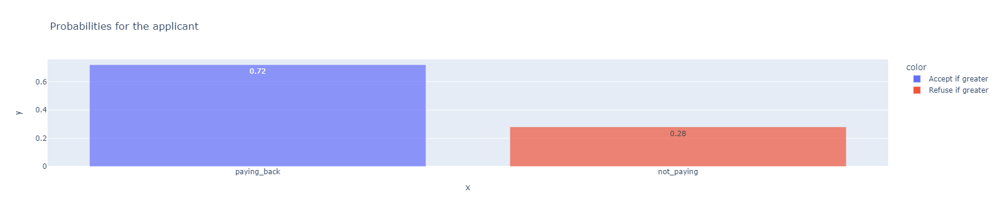

In [334]:
id_input = 100065
proba_paying = np.round(float(dashboard_data.loc[dashboard_data.SK_ID_CURR==id_input, "PROBABILITY_PAYING"].values),2)
proba_not_paying = np.round(float(dashboard_data.loc[dashboard_data.SK_ID_CURR==id_input, "PROBABILITY_NOT_PAYING"].values),2)

fig = px.bar(data_frame=dashboard_data,
             x = ['paying_back','not_paying'], 
             y=[proba_paying, proba_not_paying], 
             color=['Accept if greater','Refuse if greater'], 
             opacity=0.7,
             title='Probabilities for the applicant',
             text=[proba_paying,proba_not_paying]
            )
fig.show()

In [335]:
from sklearn.metrics import precision_recall_curve, roc_auc_score, auc

ypred = model.predict_proba(Xtest3.values)
yscore = ypred[:,1]
fpr, tpr, thresholds_rc = roc_curve(ytest3,yscore, pos_label=1)
AUC = roc_auc_score(ytest3,yscore)

precision, recall, thresholds_pc = precision_recall_curve(ytest3,yscore, pos_label=1)
print("Lengths are different :")
print(len(precision),'\n', len(recall),'\n', len(thresholds_pc))

# Extracting dataframes.
data_roc_curve = pd.DataFrame({'fpr':fpr,'tpr':tpr,'thresholds':thresholds_rc})
data_roc_curve.to_csv("fpr_tpr_table.csv")

data_precision_recall = pd.DataFrame({'precision':precision[:-1],'recall':recall[:-1],'thresholds':thresholds_pc})
data_precision_recall.to_csv("precision_recall_table.csv")

Lengths are different :
61420 
 61420 
 61419


In [336]:
data_roc_curve["tpr-fpr"] = data_roc_curve.tpr - data_roc_curve.fpr
best_threshold_index = np.argmax(data_roc_curve["tpr-fpr"])
data_roc_curve.loc[best_threshold_index, ["tpr","fpr","thresholds"]]

tpr           0.685196
fpr           0.309266
thresholds    0.454203
Name: 5302, dtype: float64

In [337]:
data_roc_curve.loc[best_threshold_index,'tpr'] - data_roc_curve.loc[best_threshold_index,'fpr']

0.3759298765768288

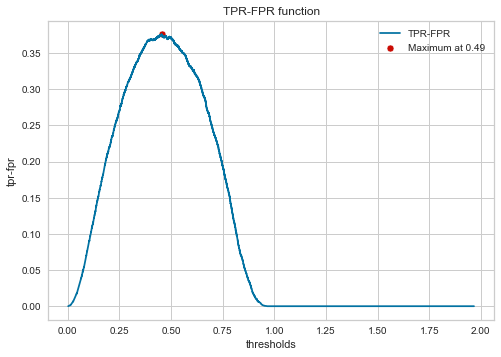

In [338]:
xmax = data_roc_curve.loc[best_threshold_index,'thresholds']
ymax = data_roc_curve.loc[best_threshold_index,'tpr'] - data_roc_curve.loc[best_threshold_index,'fpr']
plt.figure()
sns.lineplot(data= data_roc_curve, x='thresholds', y='tpr-fpr', label='TPR-FPR')

sns.scatterplot(x=[xmax],y=[ymax],color='r', label="Maximum at 0.49")
plt.title("TPR-FPR function");

In [339]:
# calculate the g-mean for each threshold
gmeans = np.sqrt(tpr * (1-fpr))

# locate the index of the largest g-mean
ix = np.argmax(gmeans)
print('Best Threshold=%f, G-Mean=%.3f' % (thresholds_rc[ix], gmeans[ix]))


Best Threshold=0.454203, G-Mean=0.688


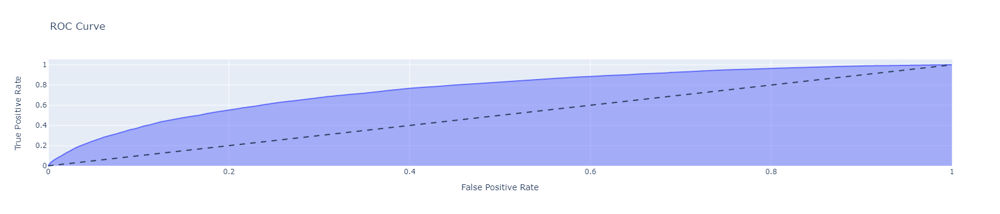

In [340]:
from sklearn.metrics import precision_recall_curve
import plotly.graph_objects as go

rocfig = px.area(x=fpr, y=tpr, labels={"x":"False Positive Rate","y":"True Positive Rate"},title="ROC Curve",)
rocfig.add_shape(
        type='line', line=dict(dash='dash'),
        x0=0, x1=1, y0=0, y1=1)
rocfig.show()

Average Precision = 0.23317774576977823


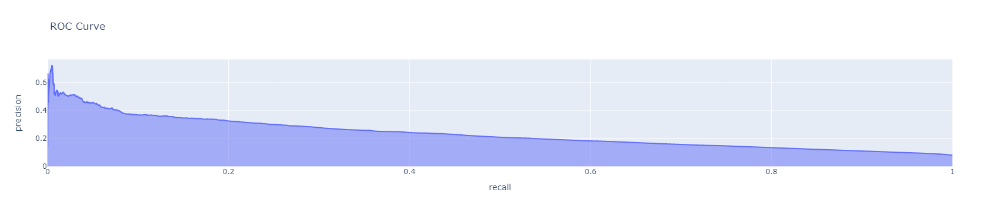

In [341]:
from sklearn.metrics import precision_recall_curve, average_precision_score
import plotly.graph_objects as go
pr_score = average_precision_score(ytest3, yscore, pos_label=1)
print(f"Average Precision = {pr_score}")
prfig = px.area(data_frame=data_precision_recall, 
                x='recall',
                y='precision',
                labels={"x":"False Positive Rate","y":"True Positive Rate"},title="ROC Curve",
               )

prfig.show()

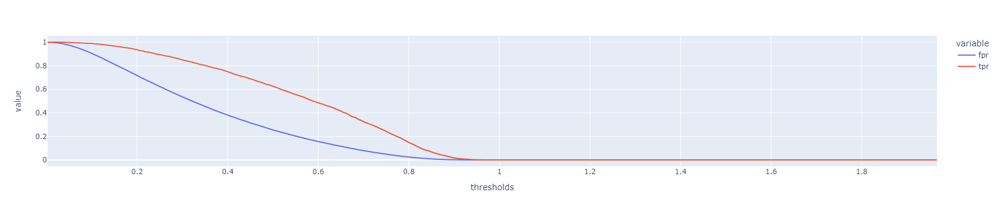

In [342]:
# FPR, TPR, against threshold
px.line(data_frame=data_roc_curve, x='thresholds', y=['fpr','tpr'])

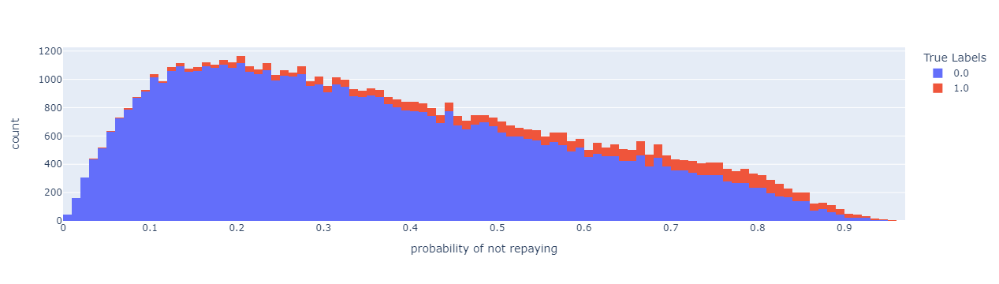

In [359]:
fig_hist = px.histogram(
    x=ypred[:,1], color=ytest3, nbins=100,
    labels=dict(color='True Labels', x='probability of not repaying')
)

fig_hist.show()

In [344]:
# Confusion matrix

In [303]:
y_table = pd.DataFrame({"ytrue":ytest3, "ypred": model.predict(Xtest3), "yscore":yscore})
y_table.to_csv("y_table.csv")

descriptions.fillna("unknown")
#descriptions.to_csv("descriptions_applicants_2.csv")

C:\Users\daris\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but StandardScaler was fitted without feature names



NameError: name 'descriptions' is not defined

# Fonction coût

In [345]:
if "PREDICTIONS" in dTrain3.columns:
    dTrain3 = dTrain3.drop(columns='PREDICTIONS')
if "PREDICT_PROBA" in dTrain3.columns:
    dTrain3 = dTrain3.drop(columns='PREDICT_PROBA')


Xfc = dTrain3.drop(columns=['TARGET','SK_ID_CURR'])
yfc = dTrain3.TARGET

dTrain3["PREDICTIONS"] = model.predict(Xfc.values)
dTrain3["PREDICT_PROBA"] = model.predict_proba(Xfc.values)[:,1]

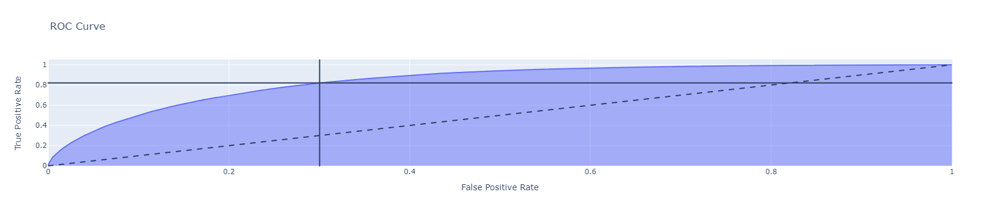

In [346]:
fpr, tpr, thresholds = roc_curve(dTrain3.TARGET, dTrain3.PREDICT_PROBA)
droc = pd.DataFrame({'fpr':fpr, 'tpr':tpr, 'thresholds':thresholds})
droc["tpr_fpr"] = droc.tpr - droc.fpr
roc = px.area(x=fpr, y=tpr, labels={"x":"False Positive Rate","y":"True Positive Rate"},title="ROC Curve",)
roc.add_shape(
        type='line', line=dict(dash='dash'),
        x0=0, x1=1, y0=0, y1=1)
roc.add_vline(droc.loc[np.argmax(droc['tpr_fpr']),'fpr'])
roc.add_hline(droc.loc[np.argmax(droc['tpr_fpr']),'tpr'])
roc.show()

In [347]:
# Threshold list
threshold_limited_list = np.arange(min(thresholds), max(thresholds), 0.05)
len(threshold_limited_list)

40

In [348]:
dTrain3

,SK_ID_CURR,TARGET,AMT_CREDIT,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,ANNUITY_INCOME_PERC,PAYMENT_RATE,PREV_DAYS_DECISION_MAX,PREV_CNT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_MIN,PREDICTIONS,PREDICT_PROBA
0,100002,1.0,406597.5,0.018801,-9461,-3648.0,-2120,0.083037,0.262949,0.139376,-1134.0,0.121978,0.060749,-606.0,24.000000,9251.775,1.0,0.858357
1,100003,0.0,1293502.5,0.003541,-16765,-1186.0,-291,0.311267,0.622246,0.509353,-828.0,0.132217,0.027598,-746.0,10.000000,6662.970,0.0,0.316214
2,100004,0.0,135000.0,0.010032,-19046,-4260.0,-2531,0.501964,0.555912,0.729567,-815.0,0.100000,0.050000,-815.0,4.000000,5357.250,0.0,0.162073
3,100006,0.0,312682.5,0.008019,-19005,-9833.0,-2437,0.501964,0.650442,0.509353,-617.0,0.219900,0.094941,-181.0,23.000000,2482.920,0.0,0.209156
4,100007,0.0,513000.0,0.028663,-19932,-4311.0,-3458,0.501964,0.322738,0.509353,-1106.0,0.179963,0.042623,-374.0,20.666667,0.180,0.0,0.491525
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0.0,254700.0,0.032561,-9327,-8456.0,-1982,0.145570,0.681632,0.509353,-273.0,0.174971,0.108198,-273.0,8.000000,6605.910,0.0,0.421116
307507,456252,0.0,269550.0,0.025164,-20775,-4388.0,-4090,0.501964,0.115992,0.509353,0.0,0.166687,0.044524,-2497.0,6.000000,10046.880,1.0,0.528421
307508,456253,0.0,677664.0,0.005002,-14966,-6737.0,-5150,0.744026,0.535722,0.218859,-1909.0,0.195941,0.044239,-1909.0,5.000000,27.270,0.0,0.289590
307509,456254,1.0,370107.0,0.005313,-11961,-2562.0,-931,0.501964,0.514163,0.661024,-322.0,0.118158,0.054592,-277.0,15.000000,2296.440,1.0,0.620583


In [352]:
# Resetting the index of dTrain3
dTrain3 = dTrain3.reset_index(drop=True)
parameter = "AMT_CREDIT"

#Lists
TP=[]
FP=[]
TN=[]
FN=[]
summation = []
for threshold in threshold_limited_list:
    print(f"Threshold = {threshold}")
    for i in range(len(dTrain3)):
        
        # Condition for True Positives, real 1.0.
        if dTrain3.loc[i, "TARGET"] == 1.0 and dTrain3.loc[i, "PREDICT_PROBA"]>threshold:
            TP.append(dTrain3.loc[i, parameter])

        # Condition for False Negatives
        elif dTrain3.loc[i, "TARGET"] == 1.0 and dTrain3.loc[i, "PREDICT_PROBA"]<threshold:
            FN.append(dTrain3.loc[i, parameter])

        # Condition for True Negatives
        elif dTrain3.loc[i, "TARGET"] == 0.0 and dTrain3.loc[i, "PREDICT_PROBA"]<threshold:
            TN.append(dTrain3.loc[i, parameter])

        # Condition for False Positives
        elif dTrain3.loc[i, "TARGET"] == 0.0 and dTrain3.loc[i, "PREDICT_PROBA"]>threshold:
            FP.append(dTrain3.loc[i, parameter])

    summation.append([threshold, sum(TP), sum(FP), sum(TN), sum(FN)])

Threshold = 0.0015536784086014074
Threshold = 0.05155367840860141
Threshold = 0.10155367840860141
Threshold = 0.15155367840860143
Threshold = 0.20155367840860142
Threshold = 0.25155367840860143
Threshold = 0.3015536784086015
Threshold = 0.35155367840860147
Threshold = 0.40155367840860146
Threshold = 0.45155367840860144
Threshold = 0.5015536784086014
Threshold = 0.5515536784086015
Threshold = 0.6015536784086015
Threshold = 0.6515536784086015
Threshold = 0.7015536784086015
Threshold = 0.7515536784086014
Threshold = 0.8015536784086015
Threshold = 0.8515536784086015
Threshold = 0.9015536784086015
Threshold = 0.9515536784086015
Threshold = 1.0015536784086014
Threshold = 1.0515536784086015
Threshold = 1.1015536784086015
Threshold = 1.1515536784086016
Threshold = 1.2015536784086016
Threshold = 1.2515536784086014
Threshold = 1.3015536784086015
Threshold = 1.3515536784086015
Threshold = 1.4015536784086016
Threshold = 1.4515536784086016
Threshold = 1.5015536784086014
Threshold = 1.55155367840860

In [353]:
dsum = pd.DataFrame(summation, columns=["thresholds","sum_TP", "sum_FP","sum_TN","sum_FN"])
dsum["TP-FN"] = (dsum.loc[:,"sum_TP"] - dsum.loc[:,"sum_FN"]);
dsum["TN-FP"] = (dsum.loc[:,"sum_TN"] - dsum.loc[:,"sum_FP"]);
dsum["FN-TP"] = (dsum.loc[:,"sum_FN"] - dsum.loc[:,"sum_TP"]);
dsum["loss"] = (dsum.loc[:,"sum_FP"] + dsum.loc[:,"sum_FN"]);
#dsum.to_csv("thresholds_gain_lost.csv")

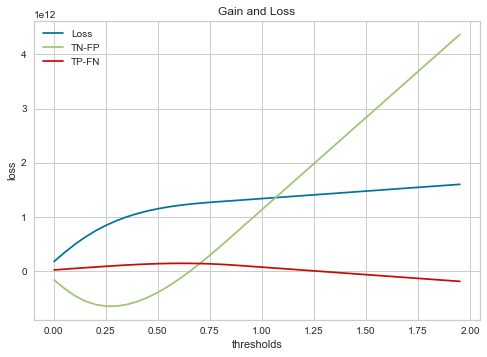

In [354]:
plt.title("Gain and Loss")
sns.lineplot(data=dsum, x='thresholds', y="loss", label="Loss")
sns.lineplot(data=dsum, x='thresholds', y="TN-FP", label="TN-FP");
sns.lineplot(data=dsum, x='thresholds', y="TP-FN", label="TP-FN");

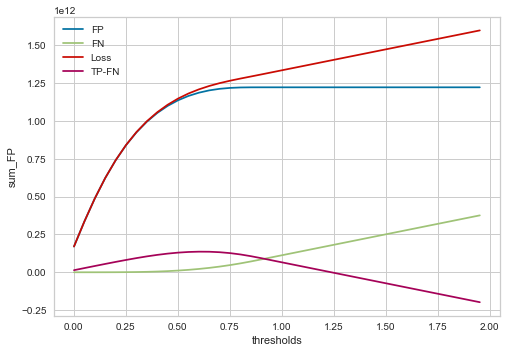

In [355]:
sns.lineplot(data=dsum, x='thresholds', y="sum_FP", label="FP")
sns.lineplot(data=dsum, x='thresholds', y="sum_FN", label="FN")
sns.lineplot(data=dsum, x='thresholds', y="loss", label="Loss");
sns.lineplot(data=dsum, x='thresholds', y="TP-FN", label="TP-FN");
plt.grid(visible=True);

In [356]:
idx = np.argmax(dsum.loc[:,"TP-FN"])
dsum.loc[idx]

thresholds    6.015537e-01
sum_TP        1.580408e+11
sum_FP        1.186014e+12
sum_TN        1.028648e+12
sum_FN        2.196823e+10
TP-FN         1.360726e+11
TN-FP        -1.573657e+11
FN-TP        -1.360726e+11
loss          1.207982e+12
Name: 12, dtype: float64

> Nous choisissons comme fonction coût la f(theshold) = FN(threshold) - TP(threshold).

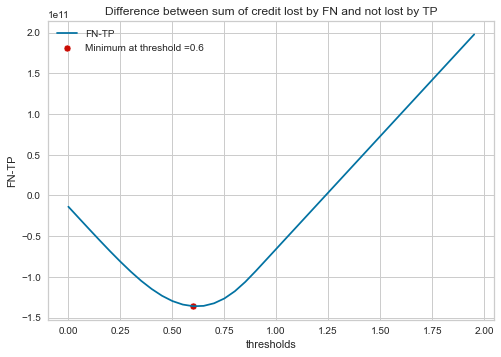

In [357]:
sns.lineplot(data=dsum, x='thresholds', y="FN-TP", label="FN-TP");
idxmin = np.argmin(dsum.loc[:,"FN-TP"])
sns.scatterplot(x=[dsum.loc[idxmin, "thresholds"]], y=[dsum.loc[idxmin, "FN-TP"]], color='r', label=f"Minimum at threshold ={round(dsum.loc[idxmin,'thresholds'],2)}");
#plt.text(dsum.loc[idxmin, "thresholds"]-0.25, dsum.loc[idxmin, "FN-TP"]+1e10, s=f"Minimum at threshold ={dsum.loc[idxmin,'thresholds']}");
plt.title("Difference between sum of credit lost by FN and not lost by TP");

Les pertes d'argent sont minimisées pour un seuil (threshold) de $0.60$. Plus haut, nous avons vu que le seuil donnant le plus grand écart en TPR et FPR était de $0.45$. Si nous prenons la moyenne pour trouver un bon compromis, nous sommes proche de $0.5$.

In [358]:
(0.6+0.45)/2

0.525